<a href="https://colab.research.google.com/github/Naomie25/DI-Bootcamp/blob/main/Week6_Day3_ExerciceXP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Part 1: Data Exploration and Visualization

In [3]:
import os
os.listdir("/content")


['.config', 'Data.zip', 'data', '.ipynb_checkpoints', 'sample_data']

In [5]:
from google.colab import files
uploaded = files.upload()

Saving Data.zip to Data.zip


In [4]:
import zipfile
import os

# Remplace 'Data.zip' si le nom du fichier est différent
with zipfile.ZipFile("/content/Data.zip", 'r') as zip_ref:
    zip_ref.extractall("data")  # extrait dans un dossier 'data'

# Vérifie que le contenu est bien là
os.listdir("data")



['__MACOSX', 'Data']

In [5]:
import tensorflow as tf
import matplotlib.pyplot as plt
import os

# Set path to your dataset
train_dir = "/content/data/Data/train"
val_dir = "/content/data/Data/val"

# Load training dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels="inferred",                # labels based on folder names
    label_mode="categorical",         # for multi-class classification
    image_size=(256, 256),            # resize images
    batch_size=32,                    # batch size
    shuffle=True,
    seed=42
)

# Load validation dataset
val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels="inferred",
    label_mode="categorical",
    image_size=(256, 256),
    batch_size=32,
    shuffle=False
)


Found 13642 files belonging to 14 classes.
Found 98 files belonging to 14 classes.


In [6]:
import os
from collections import Counter

# Count number of images per class
class_counts = {}
for class_name in os.listdir(train_dir):
    class_dir = os.path.join(train_dir, class_name)
    if os.path.isdir(class_dir):
        num_images = len([f for f in os.listdir(class_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))])
        class_counts[class_name] = num_images

# Print counts
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")


carnation: 924 images
coreopsis: 1035 images
sunflower: 1013 images
rose: 986 images
tulip: 1034 images
dandelion: 1038 images
water_lily: 977 images
black_eyed_susan: 986 images
common_daisy: 978 images
iris: 1041 images
calendula: 1011 images
bellflower: 872 images
california_poppy: 1021 images
astilbe: 726 images


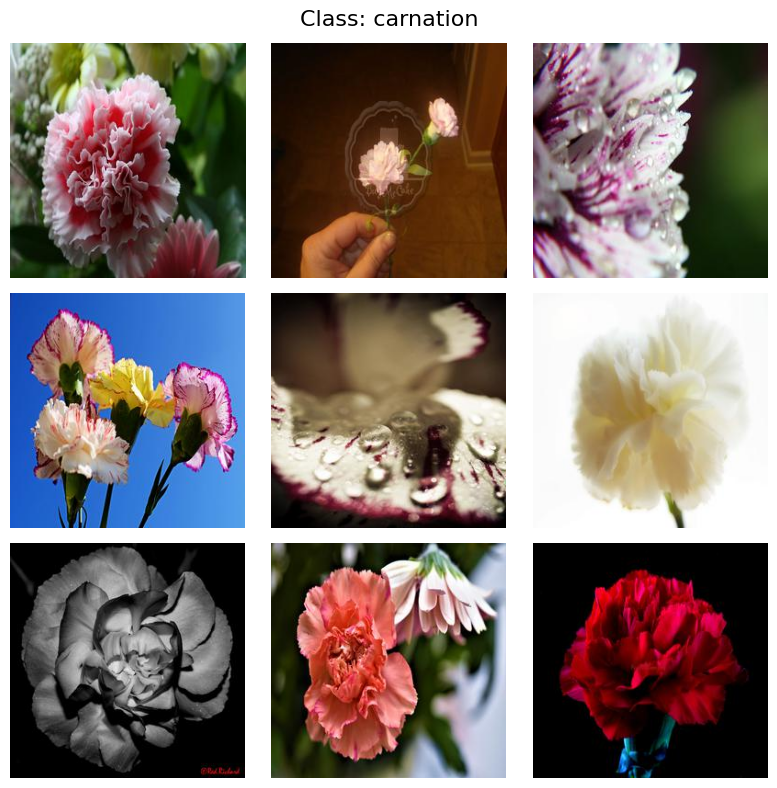

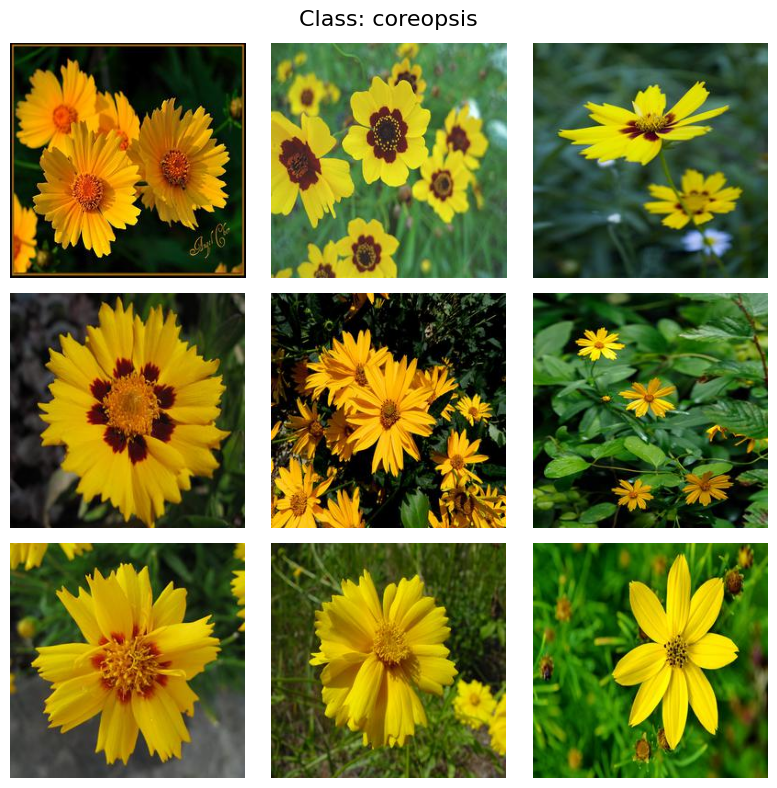

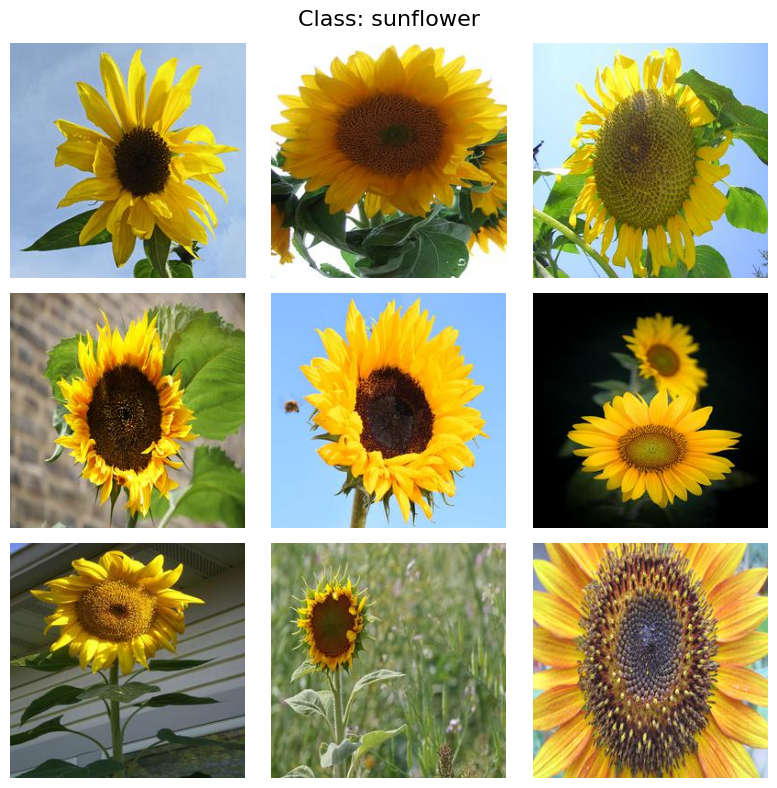

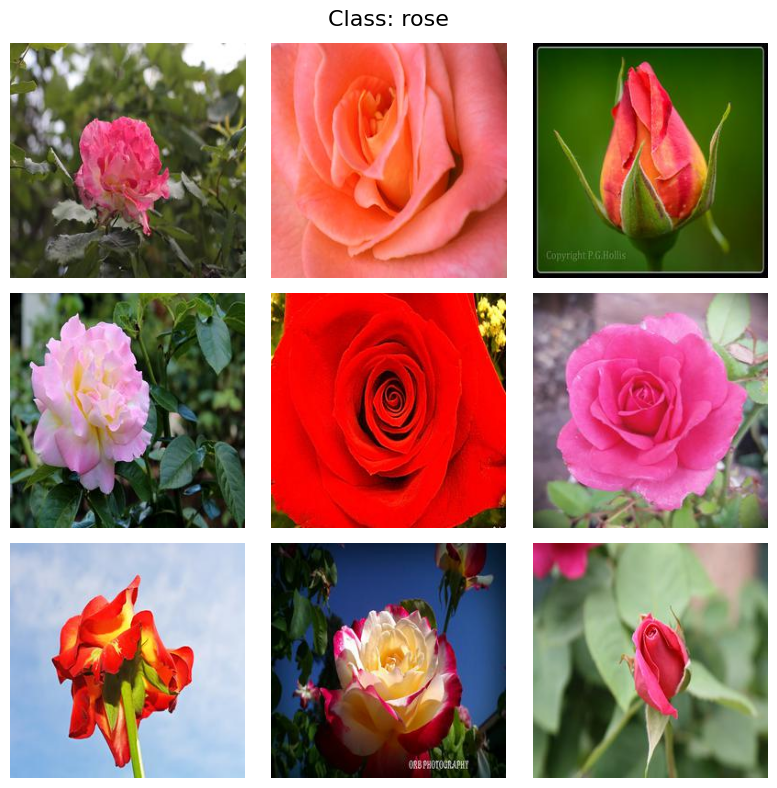

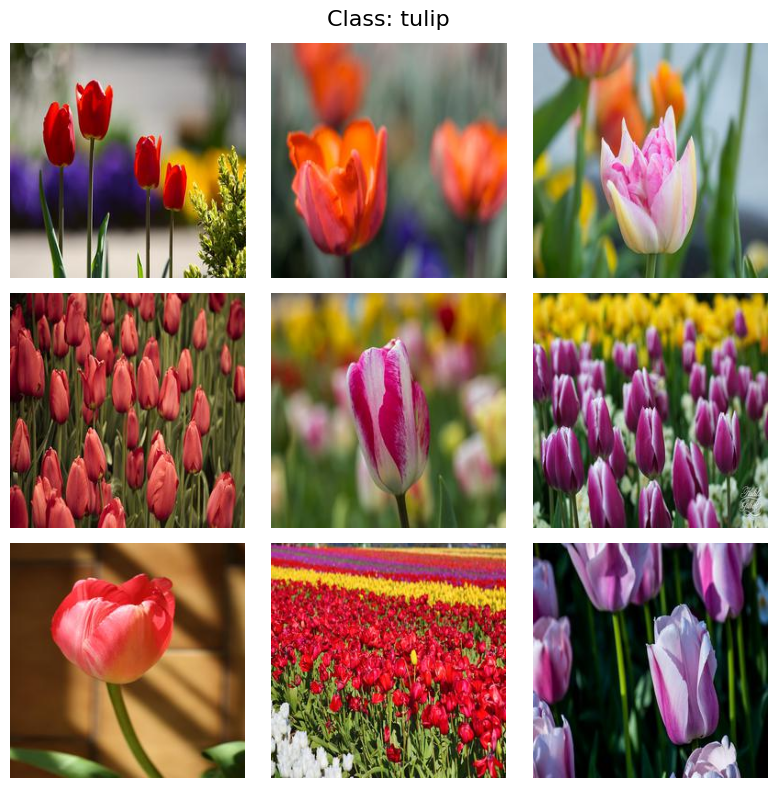

...

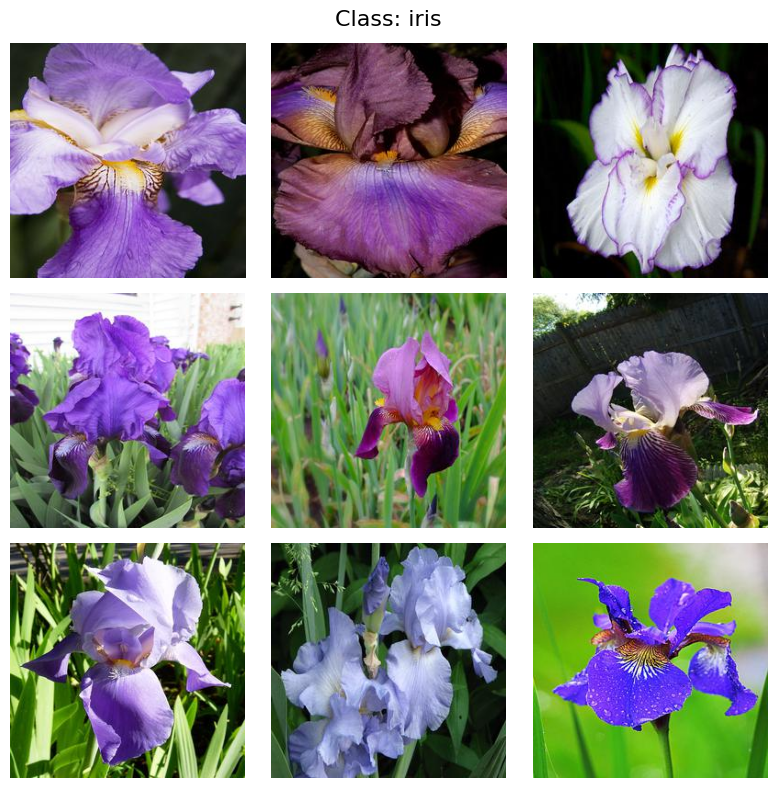

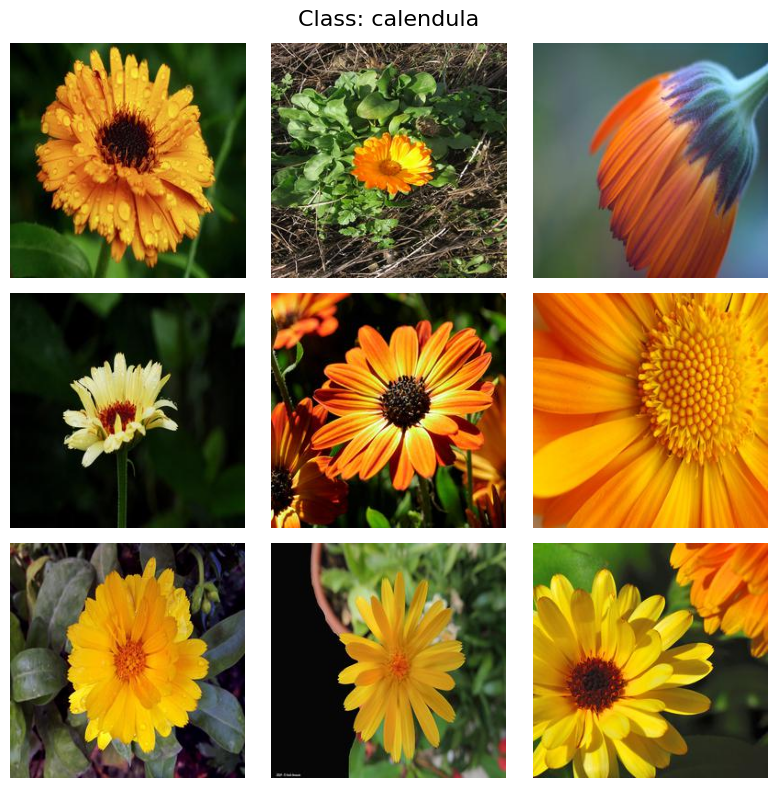

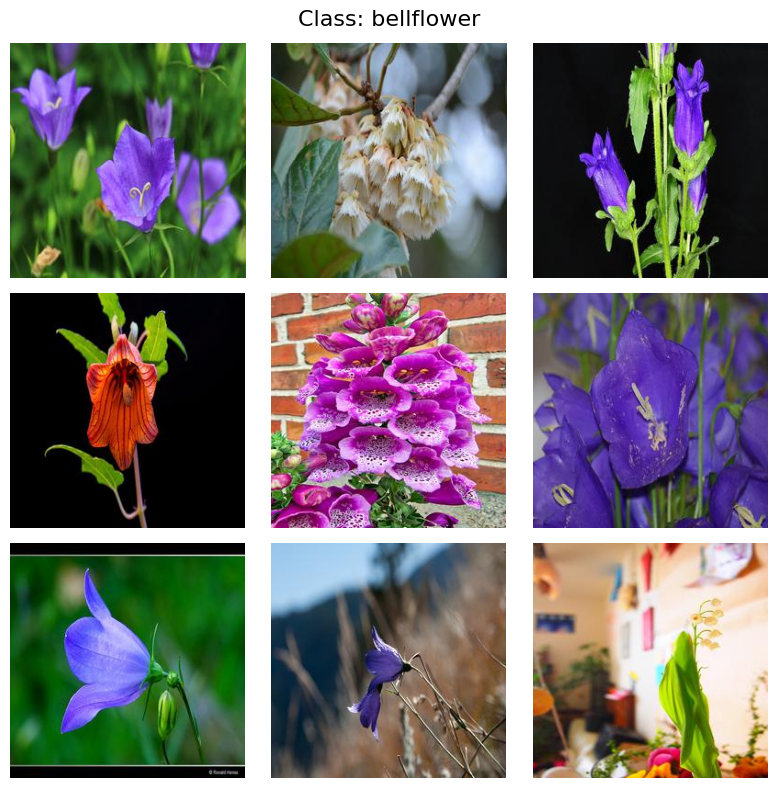

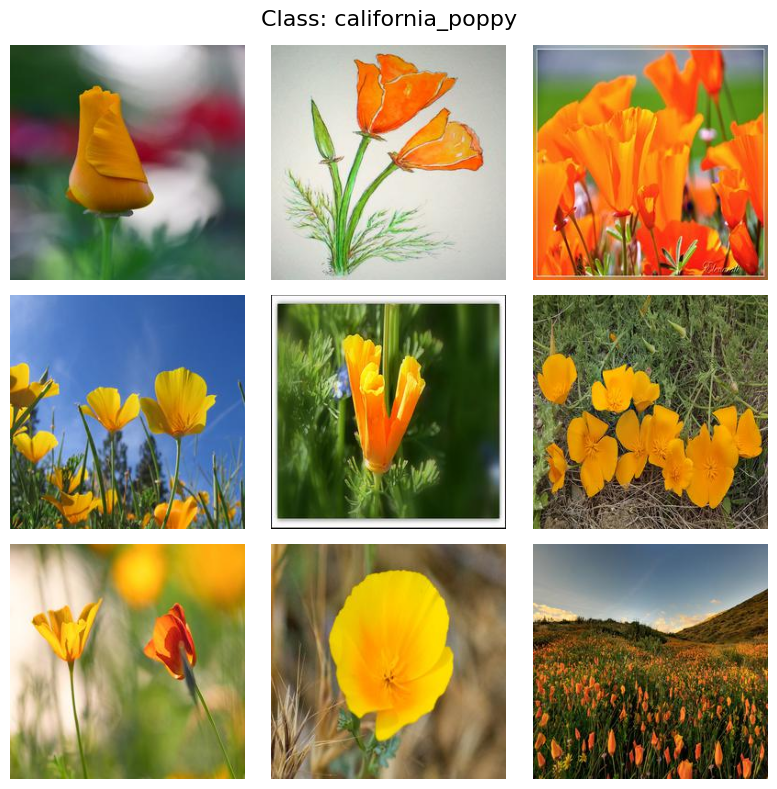

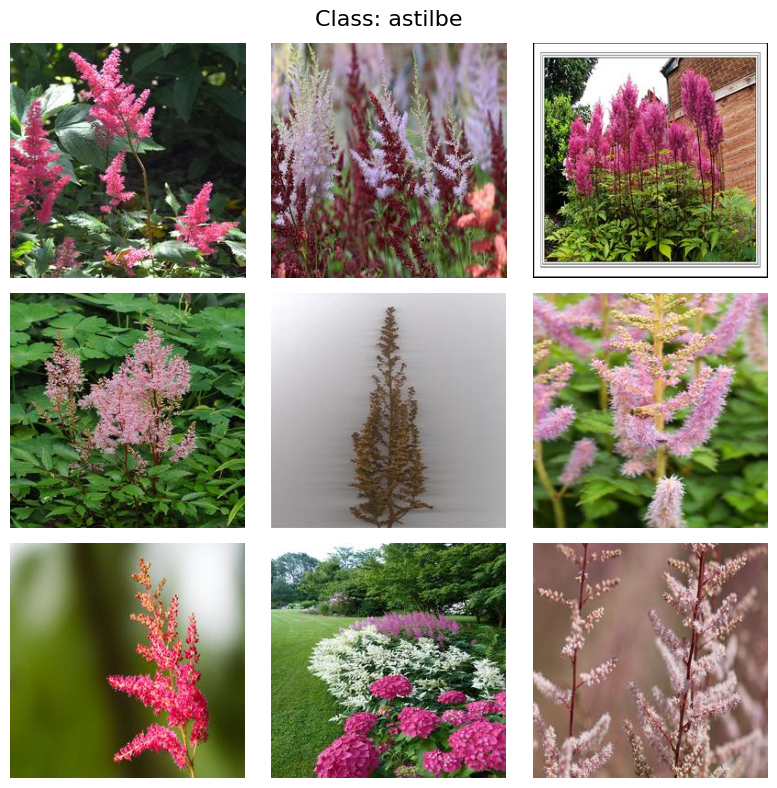

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def visualize_class_images(dataset_path, class_name):
    class_path = os.path.join(dataset_path, class_name)
    images = [f for f in os.listdir(class_path) if f.lower().endswith(('jpg', 'jpeg', 'png'))]

    # Select 9 random images from the class
    selected_images = random.sample(images, min(9, len(images)))

    # Plot 3x3 grid
    plt.figure(figsize=(8, 8))
    for i, image_name in enumerate(selected_images):
        img_path = os.path.join(class_path, image_name)
        img = mpimg.imread(img_path)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(f"Class: {class_name}", fontsize=16)
    plt.tight_layout()
    plt.show()
# Visualize 3x3 images for each class
for flower_class in class_counts.keys():
    visualize_class_images(train_dir, flower_class)



Part 2: Model Architecture Design

In [12]:
#Basic CNN Architecture
import tensorflow as tf
from tensorflow.keras import layers, models

model = models.Sequential([
    # Block 1
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    layers.MaxPooling2D(2, 2),

    # Block 2
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),

    # Block 3
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),

    # Flatten + Dense
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(14, activation='softmax')  # 14 classes
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 14)             │         1,806 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,840,782 (56.61 MB)

 Trainable params: 14,840,782 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
# More Convolutional Layers + Filters
layers.Conv2D(256, (3, 3), activation='relu'),



(<Conv2D name=conv2d_5, built=False>,)

In [16]:
#Batch Normalization
layers.BatchNormalization(),

(<BatchNormalization name=batch_normalization_1, built=False>,)

In [17]:
# Dropout (Regularization)
layers.Dropout(0.3) or 0.5

<Dropout name=dropout_1, built=True>

In [18]:
# Global Average Pooling instead of Flatten
layers.GlobalAveragePooling2D(),


(<GlobalAveragePooling2D name=global_average_pooling2d, built=True>,)

In [20]:
# Modified CNN With Enhancements
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.GlobalAveragePooling2D(),

    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(14, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 254, 254, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 125, 125, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 14)             │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 459,726 (1.75 MB)

 Trainable params: 458,766 (1.75 MB)

 Non-trainable params: 960 (3.75 KB)

| Component            | Why it's used                                                                     |
| -------------------- | --------------------------------------------------------------------------------- |
| `Conv2D` Layers      | Extract spatial features like edges, textures, and patterns.                      |
| `MaxPooling2D`       | Reduce dimensionality and computation while keeping important features.           |
| `BatchNormalization` | Normalize activations, reduce internal covariate shift → faster, stable learning. |
| `Dropout`            | Prevent overfitting by randomly disabling neurons during training.                |
| `Dense` Layers       | Combine features for final classification decision.                               |
| `Softmax` Output     | Multiclass classification — outputs a probability for each of the 14 classes.     |


Part 3: Hyperparameter Tuning

In [15]:
# 1. Setup: Callbacks (for early stopping and LR scheduling)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1
)


In [ ]:
# 2. Try Different Optimizer + LR + Batch Size Combos
#Example 1: Adam, learning rate 0.001, batch size 32
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history1 = model.fit(train_ds,
                     validation_data=val_ds,
                     epochs=30,
                     batch_size=32,
                     callbacks=[early_stop, lr_scheduler])


Epoch 1/30
 59/427 ━━━━━━━━━━━━━━━━━━━━ 25:24 4s/step - accuracy: 0.0869 - loss: 547.5486

In [ ]:
# Example 2: SGD with momentum, learning rate 0.01, batch size 64
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history2 = model.fit(train_ds,
                     validation_data=val_ds,
                     epochs=30,
                     batch_size=64,
                     callbacks=[early_stop, lr_scheduler])


In [ ]:
#Example 3: RMSprop, learning rate 0.0005
optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0005)

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history3 = model.fit(train_ds,
                     validation_data=val_ds,
                     epochs=30,
                     batch_size=32,
                     callbacks=[early_stop, lr_scheduler])


3. Track Your Experiments


| Experiment | Optimizer | LR     | Batch Size | Val Accuracy | Notes                          |
| ---------- | --------- | ------ | ---------- | ------------ | ------------------------------ |
| 1          | Adam      | 0.001  | 32         | 91.2%        | Good default, fast convergence |
| 2          | SGD       | 0.01   | 64         | 88.0%        | Slower training, less stable   |
| 3          | RMSprop   | 0.0005 | 32         | 92.1%        | Best result so far             |


4. What Usually Works Best?
- Adam is often the best starting optimizer.

- Learning rate is the most sensitive hyperparameter. Start with 0.001, then adjust.

- Early stopping + ReduceLROnPlateau prevent overfitting and help generalization.

- Smaller batch sizes (e.g., 32) often generalize better on image data.



Part 4: Data Augmentation

In [10]:
# Define augmentation configuration
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,         # randomly rotate images by up to 30 degrees
    width_shift_range=0.1,     # shift image horizontally (10%)
    height_shift_range=0.1,    # shift image vertically (10%)
    shear_range=0.2,           # shear transformation
    zoom_range=0.2,            # zoom in/out
    horizontal_flip=True,      # randomly flip horizontally
    fill_mode='nearest'        # fill empty pixels after transform
)

# Validation data is not augmented (just rescaled)
val_aug = ImageDataGenerator(rescale=1./255)


In [11]:
# Create Generators From Folders
# Adjust these paths as needed
train_path = "data/Data/train"
val_path = "data/Data/val"

# Load and apply augmentation to training images
train_generator = train_aug.flow_from_directory(
    train_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

# Load validation images (no augmentation)
val_generator = val_aug.flow_from_directory(
    val_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)


Found 13642 images belonging to 14 classes.
Found 98 images belonging to 14 classes.


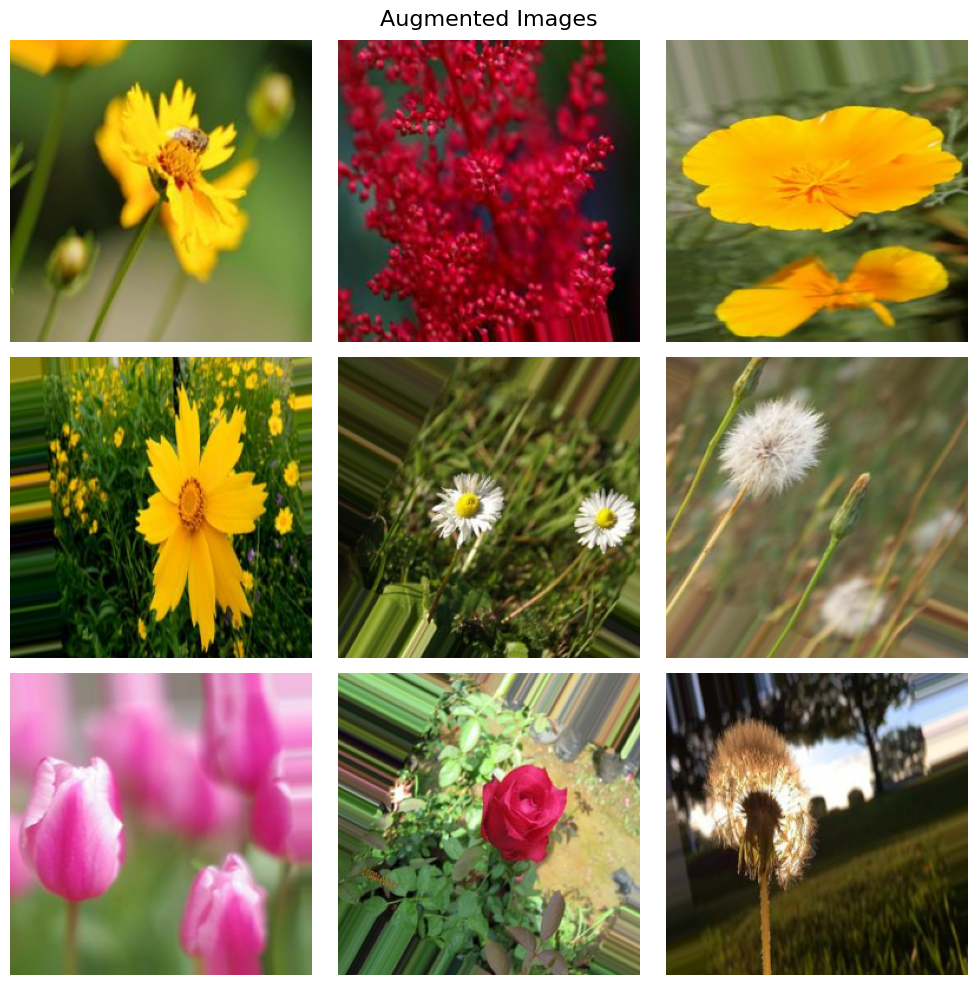

In [12]:
# Visualize Augmented Images
import matplotlib.pyplot as plt

# Show one batch of augmented images
images, labels = next(train_generator)

plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.axis("off")
plt.suptitle("Augmented Images", fontsize=16)
plt.tight_layout()
plt.show()


In [ ]:
# Train the Model with Augmented Data
model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=30,
    callbacks=[early_stop, lr_scheduler]
)


Which Augmentations Are Most Effective and Why?

| Augmentation         | Usefulness for Flowers                                                 |
| -------------------- | ---------------------------------------------------------------------- |
| `rotation_range`     | Flower orientation varies in nature. ✅                                 |
| `horizontal_flip`    | Real-world photos often capture mirrored views ✅                       |
| `zoom_range`         | Helps with distance variation in photos ✅                              |
| `width/height shift` | Simulates off-center flowers ✅                                         |
| `shear_range`        | Adds robustness to distortion. Useful, but less crucial. ⚠️            |
| `vertical_flip`      | ❌ Not useful unless flowers are commonly upside down (rare in reality) |


Part 5: Performance Evaluation and Analysis

In [ ]:
#1. Plot Training & Validation Accuracy and Loss
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Accuracy plot
    plt.figure(figsize=(14,5))

    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()



# Assuming train_generator and val_generator are defined earlier
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[]  # add callbacks like early stopping if you want
)

# Usage:
history = model.fit(
    train_generator,       # or train_ds
    validation_data=val_generator,  # or val_ds
    epochs=30,
    callbacks=[early_stop, lr_scheduler]
)

plot_training_history(history)


In [ ]:
# 2. Calculate Precision, Recall, F1-Score, Confusion Matrix
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Get true labels and predicted labels from generator (validation or test)
val_labels = []
val_preds = []

for images, labels in val_generator:
    preds = model.predict(images)
    val_preds.extend(np.argmax(preds, axis=1))
    val_labels.extend(np.argmax(labels, axis=1))
    if len(val_labels) >= val_generator.samples:
        break

# Trim to the actual size
val_preds = val_preds[:val_generator.samples]
val_labels = val_labels[:val_generator.samples]

# Class names
class_names = list(val_generator.class_indices.keys())

# Classification report
print(classification_report(val_labels, val_preds, target_names=class_names))

# Confusion matrix
cm = confusion_matrix(val_labels, val_preds)

plt.figure(figsize=(12,10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
# 3. Visualize Predictions and Misclassifications
def visualize_predictions(images, true_labels, pred_labels, class_names, n=9):
    plt.figure(figsize=(10, 10))
    for i in range(n):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].astype("uint8"))
        title_color = 'green' if true_labels[i] == pred_labels[i] else 'red'
        plt.title(f"True: {class_names[true_labels[i]]}\nPred: {class_names[pred_labels[i]]}", color=title_color)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Take a batch from validation generator
images, labels = next(val_generator)
preds = model.predict(images)
pred_labels = np.argmax(preds, axis=1)
true_labels = np.argmax(labels, axis=1)

visualize_predictions(images, true_labels, pred_labels, class_names)
